In [ ]:
# Torch - Torchvision - IceVision - IceData - MMDetection - YOLOv5 - EfficientDet Installation
!wget https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh

# Choose your installation target: cuda11 or cuda10 or cpu
!bash icevision_install.sh cuda11 master

--2022-02-14 05:18:51--  https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2691 (2.6K) [text/plain]
Saving to: ‘icevision_install.sh’

icevision_install.s 100%[===================>]   2.63K  --.-KB/s    in 0s      

2022-02-14 05:18:52 (35.1 MB/s) - ‘icevision_install.sh’ saved [2691/2691]

Installing icevision + dependencices for cuda11
- Installing torch and its dependencies
Looking in links: https://download.pytorch.org/whl/torch_stable.html
- Installing mmcv
     |████████████████████████████████| 51.3 MB 279 kB/s 
     |████████████████████████████████| 190 kB 4.3 MB/s 
- Installing mmdet
     |████████████████████████████████| 1.2 MB 4.4 MB/s 
- Installing icevision from mast

In [ ]:
# Restart kernel after installation
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

{'restart': True, 'status': 'ok'}

In [ ]:
from icevision.all import *

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:70
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


0B [00:00, ?B/s]

In [ ]:
!git clone https://github.com/Shenggan/BCCD_Dataset.git

Cloning into 'BCCD_Dataset'...
remote: Enumerating objects: 800, done.
remote: Total 800 (delta 0), reused 0 (delta 0), pack-reused 800
Receiving objects: 100% (800/800), 7.39 MiB | 13.06 MiB/s, done.
Resolving deltas: 100% (378/378), done.


In [ ]:
!ls                  # output: BCCD_Dataset (among others)
%cd BCCD_Dataset
!ls                  # output: BCCD (among others) 
Path('/content/BCCD_Dataset/BCCD').ls()

BCCD_Dataset  icevision_install.sh  sample_data
/content/BCCD_Dataset
BCCD	 example.jpg  LICENSE  README.md  test.csv
dataset  export.py    plot.py  scripts


(#3) [Path('/content/BCCD_Dataset/BCCD/ImageSets'),Path('/content/BCCD_Dataset/BCCD/Annotations'),Path('/content/BCCD_Dataset/BCCD/JPEGImages')]

In [ ]:
data_dir = Path('/content/BCCD_Dataset/BCCD')
images_dir = data_dir/ 'JPEGImages'
annotations_dir = data_dir/'Annotations'

In [ ]:
parser = parsers.VOCBBoxParser(annotations_dir = annotations_dir,
                     images_dir = images_dir)

In [ ]:
train_records, valid_records = parser.parse()
parser.class_map

  0%|          | 0/364 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/364 [00:00<?, ?it/s]

AUTOFIX-FAIL - (record_id: BloodImage_00338) - Cannot auto-fix coordinates: <BBox (xmin:504, ymin:337, xmax:504, ymax:337)>
	x_min:504 is greater than or equal to x_max:504
	y_min:337 is greater than or equal to y_max:337 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: BloodImage_00338) Removed annotation with index: 12, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50
AUTOFIX-FAIL - (record_id: BloodImage_00343) - Cannot auto-fix coordinates: <BBox (xmin:181, ymin:329, xmax:181, ymax:329)>
	x_min:181 is greater than or equal to x_max:181
	y_min:329 is greater than or equal to y_max:329 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: BloodImage_00343) Removed annotation with index: 3, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50


<ClassMap: {'background': 0, 'WBC': 1, 'RBC': 2, 'Platelets': 3}>

BaseRecord

common: 
	- Image size ImgSize(width=640, height=480)
	- Filepath: /content/BCCD_Dataset/BCCD/JPEGImages/BloodImage_00284.jpg
	- Img: None
	- Record ID: BloodImage_00284
detection: 
	- BBoxes: [<BBox (xmin:227, ymin:85, xmax:328, ymax:209)>, <BBox (xmin:225, ymin:83, xmax:326, ymax:207)>, <BBox (xmin:366, ymin:1, xmax:466, ymax:96)>, <BBox (xmin:343, ymin:136, xmax:443, ymax:232)>, <BBox (xmin:166, ymin:195, xmax:286, ymax:291)>, <BBox (xmin:98, ymin:297, xmax:221, ymax:418)>, <BBox (xmin:436, ymin:83, xmax:559, ymax:204)>, <BBox (xmin:457, ymin:283, xmax:563, ymax:394)>, <BBox (xmin:552, ymin:336, xmax:640, ymax:429)>, <BBox (xmin:1, ymin:250, xmax:94, ymax:371)>, <BBox (xmin:216, ymin:209, xmax:517, ymax:480)>]
	- Class Map: <ClassMap: {'background': 0, 'WBC': 1, 'RBC': 2, 'Platelets': 3}>
	- Labels: [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1]

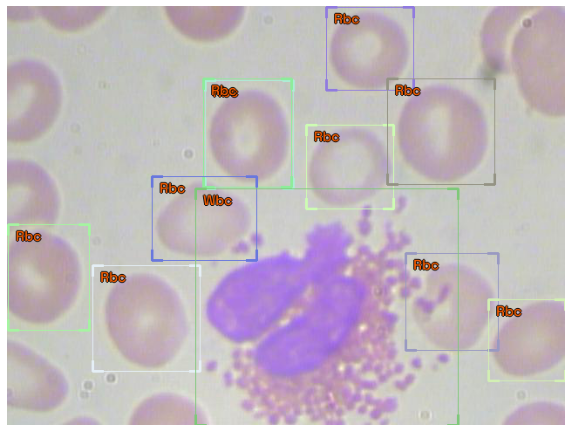

In [ ]:
show_record(train_records[1], figsize = (10,10),
            font_size=16, label_color = '#ff6000')
train_records[1]

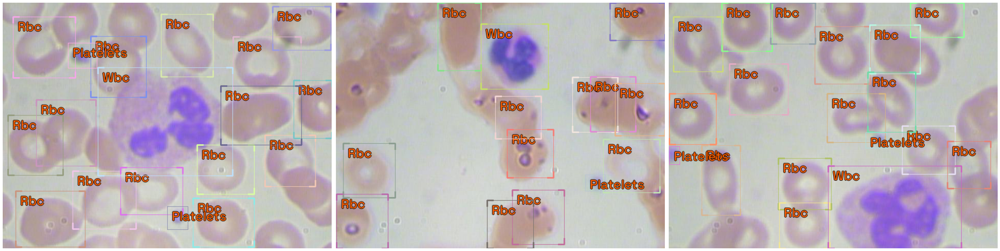

In [ ]:
show_records(train_records[5:8], ncols=3, 
             font_size=25, label_color = '#ff6000')

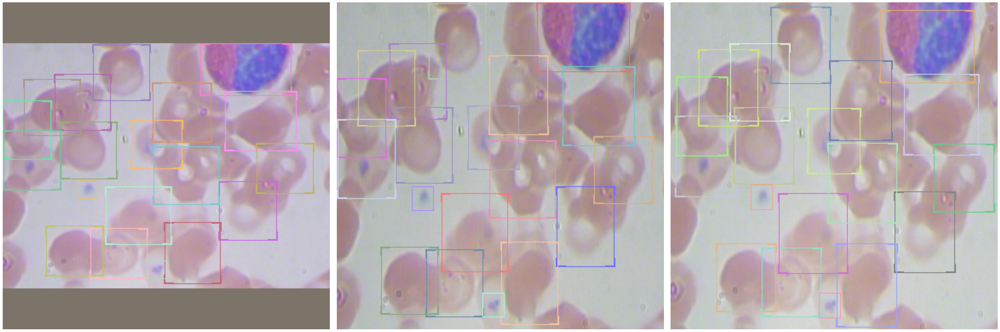

In [ ]:
presize = 512
size = 384
train_tfms = tfms.A.Adapter(
 [*tfms.A.aug_tfms(size=size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter(
 [*tfms.A.resize_and_pad(size=size), tfms.A.Normalize()])
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, denormalize_fn=denormalize_imagenet, ncols=3,
                                       display_label=False)

In [ ]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.2, 
        'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,1);

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

# **Faster R-CNN**

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


epoch,train_loss,valid_loss,COCOMetric,time
0,2.676880,2.108092,0.164025,00:43


epoch,train_loss,valid_loss,COCOMetric,time
0,1.421260,1.033804,0.265108,01:11
1,1.162679,0.845835,0.370371,00:58
2,0.998871,0.725854,0.470032,00:58
3,0.902615,0.625586,0.510287,00:57
4,0.827155,0.613033,0.528075,00:58
5,0.770260,0.581217,0.556863,00:57
6,0.734273,0.588839,0.548724,00:57
7,0.698556,0.575590,0.550385,00:57
8,0.677905,0.567733,0.573396,00:57
9,0.660749,0.565578,0.572065,00:57


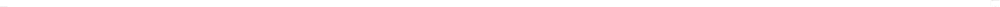

In [ ]:
model_type_frcnn = models.torchvision.faster_rcnn 
model_frcnn = model_type_frcnn.model( 
                      num_classes=len(parser.class_map))
train_dl_frcnn = model_type_frcnn.train_dl(train_ds, 
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_frcnn = model_type_frcnn.valid_dl(valid_ds, 
                      batch_size=16, num_workers=4, shuffle=False)
learn_frcnn = model_type_frcnn.fastai.learner(
                 dls=[train_dl_frcnn, valid_dl_frcnn], 
                 model=model_frcnn, metrics=metrics)
learn_frcnn.lr_find()
learn_frcnn.fine_tune(10, 2e-4, freeze_epochs=1) 
plot_metrics(learn_frcnn, 
             'Mean Average Precision and Losses for Faster_rcnn')

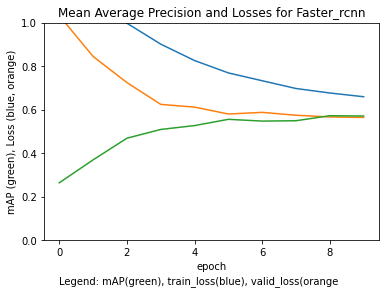

In [ ]:
plot_metrics(learn_frcnn, 
             'Mean Average Precision and Losses for Faster_rcnn')

# **YOLO V5**

  0%|          | 0.00/14.0M [00:00<?, ?B/s]

02/14/2022 05:41:11 - INFO - yolov5.models.yolo -   Overriding model.yaml nc=80 with nc=3
02/14/2022 05:41:11 - INFO - yolov5.models.yolo -   
                 from  n    params  module                                  arguments                     
02/14/2022 05:41:11 - INFO - yolov5.models.yolo -     0                -1  1      3520  yolov5.models.common.Conv               [3, 32, 6, 2, 2]              
02/14/2022 05:41:11 - INFO - yolov5.models.yolo -     1                -1  1     18560  yolov5.models.common.Conv               [32, 64, 3, 2]                
02/14/2022 05:41:12 - INFO - yolov5.models.yolo -     2                -1  1     18816  yolov5.models.common.C3                 [64, 64, 1]                   
02/14/2022 05:41:12 - INFO - yolov5.models.yolo -     3                -1  1     73984  yolov5.models.common.Conv               [64, 128, 3, 2]               
02/14/2022 05:41:12 - INFO - yolov5.models.yolo -     4                -1  2    115712  yolov5.models.common.C3   

02/14/2022 05:41:12 - INFO - yolov5.models.yolo -    10                -1  1    131584  yolov5.models.common.Conv               [512, 256, 1, 1]              
02/14/2022 05:41:12 - INFO - yolov5.models.yolo -    11                -1  1         0  torch.nn.modules.upsampling.Upsample    [None, 2, 'nearest']          
02/14/2022 05:41:12 - INFO - yolov5.models.yolo -    12           [-1, 6]  1         0  yolov5.models.common.Concat             [1]                           
02/14/2022 05:41:12 - INFO - yolov5.models.yolo -    13                -1  1    361984  yolov5.models.common.C3                 [512, 256, 1, False]          
02/14/2022 05:41:12 - INFO - yolov5.models.yolo -    14                -1  1     33024  yolov5.models.common.Conv               [256, 128, 1, 1]              
02/14/2022 05:41:12 - INFO - yolov5.models.yolo -    15                -1  1         0  torch.nn.modules.upsampling.Upsample    [None, 2, 'nearest']          
02/14/2022 05:41:12 - INFO - yolov5.models.yol

epoch,train_loss,valid_loss,COCOMetric,time
0,1.296242,1.129819,0.034240,00:14


epoch,train_loss,valid_loss,COCOMetric,time
0,0.924407,1.139100,0.118237,00:15
1,0.813875,1.455061,0.165457,00:15
2,0.747731,1.117861,0.223106,00:14
3,0.701412,0.866094,0.306402,00:14
4,0.664457,0.756519,0.303205,00:14
5,0.632931,0.643673,0.481163,00:14
6,0.604743,0.547221,0.538219,00:14
7,0.580869,0.525873,0.584507,00:14
8,0.561514,0.519982,0.595998,00:14
9,0.546258,0.512514,0.610488,00:14


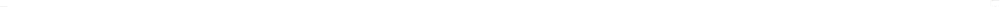

In [ ]:
model_type_yolo = models.ultralytics.yolov5 
backbone_yolo = model_type_yolo.backbones.small 
model_yolo = model_type_yolo.model(
             backbone = backbone_yolo(pretrained=True), 
             num_classes=len(parser.class_map), img_size = size)
train_dl_yolo = model_type_yolo.train_dl(train_ds, 
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_yolo = model_type_yolo.valid_dl(valid_ds, 
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_yolo = model_type_yolo.fastai.learner(
                      dls=[train_dl_yolo, valid_dl_yolo], 
                      model=model_yolo, metrics=metrics)
learn_yolo.lr_find()
learn_yolo.fine_tune(10, 1e-2 , freeze_epochs=1) 
plot_metrics(learn_yolo, 
              'Mean Average Precision and Losses for YOLOv5')

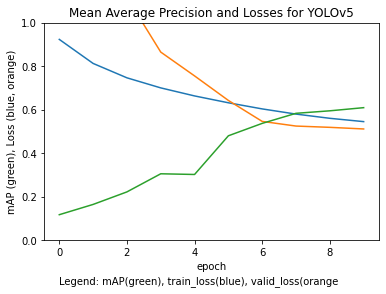

In [ ]:
plot_metrics(learn_yolo, 
              'Mean Average Precision and Losses for YOLOv5')

# **RetinaNet**

  0%|          | 0/152149505 [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/builder.py:17: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '
2022-02-14 05:47:38,632 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2022-02-14 05:47:38,633 - mmcv - INFO - load model from: torchvision://resnet50
2022-02-14 05:47:38,638 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

2022-02-14 05:47:39,700 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2022-02-14 05:47:39,743 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2022-02-14 05:47:39,811 - mmcv - INFO - initialize RetinaHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'Normal', 'name': 'retina_cls', 'std': 0.01, 'bias_prob': 0.01}}
2022-02-14 05:47:39,861 - mmcv - INFO - 
backbone.conv1.weight - torch.Size([64, 3, 7, 7]): 
PretrainedInit: load from torchvision://resnet50 
 
2022-02-14 05:47:39,863 - mmcv - INFO - 
backbone.bn1.weight - torch.Size([64]): 
PretrainedInit: load from torchvision://resnet50 
 
2022-02-14 05:47:39,866 - mmcv - INFO - 
backbone.bn1.bias - torch.Size([64]): 
PretrainedInit: load from torchvision://resnet50 
 
2022-02-14 05:47:39,868 - mmcv - INFO - 
backbone.layer1.0.conv1.weight - torch.Size([64

load checkpoint from local path: checkpoints/retinanet/retinanet_r50_fpn_1x_coco_20200130-c2398f9e.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([27, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([27]).


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,1.319103,0.831626,0.061472,00:35


epoch,train_loss,valid_loss,COCOMetric,time
0,0.752289,0.699699,0.063327,00:39
1,0.667371,0.538277,0.151133,00:38
2,0.608886,0.496884,0.254696,00:38
3,0.557438,0.431085,0.386364,00:37
4,0.516701,0.416808,0.476085,00:37
5,0.487569,0.412279,0.512709,00:37
6,0.464997,0.399387,0.514859,00:37
7,0.450095,0.398680,0.524334,00:37
8,0.436650,0.389633,0.534338,00:38
9,0.428610,0.389472,0.532546,00:37


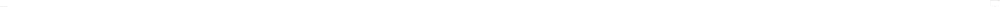

In [ ]:
model_type_ret = models.mmdet.retinanet 
backbone_r50 = model_type_ret.backbones.resnet50_fpn_1x(pretrained=True)
model_ret = model_type_ret.model(
              backbone=backbone_r50(pretrained=True), 
              num_classes= len(parser.class_map))
train_dl_ret = model_type_ret.train_dl(
          train_ds, batch_size=16, num_workers=4, shuffle=True)
valid_dl_ret = model_type_ret.valid_dl(
          valid_ds, batch_size=16, num_workers=4, shuffle=False)
learn_ret = model_type_ret.fastai.learner(
          dls=[train_dl_ret, valid_dl_ret], 
          model=model_ret, metrics=metrics)
learn_ret.lr_find()   
learn_ret.fine_tune(10, 8e-05 , freeze_epochs=1) 
plot_metrics(learn_ret, 
      'Mean Average Precision and Losses for Retinanet/Resnet50')

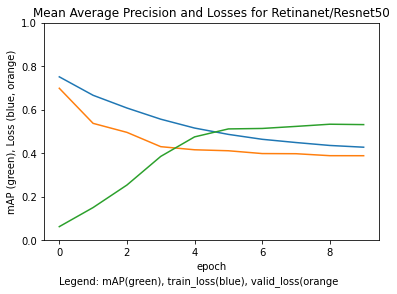

In [ ]:
plot_metrics(learn_ret, 
      'Mean Average Precision and Losses for Retinanet/Resnet50')

# **EfficientDet**

Downloading: "https://github.com/rwightman/efficientdet-pytorch/releases/download/v0.1/tf_efficientdet_lite0-f5f303a9.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientdet_lite0-f5f303a9.pth
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


epoch,train_loss,valid_loss,COCOMetric,time
0,1.333296,1.180379,0.076673,00:23


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes


epoch,train_loss,valid_loss,COCOMetric,time
0,0.779975,0.887384,0.140874,00:25
1,0.700151,0.723331,0.172714,00:23
2,0.644590,0.658918,0.294107,00:22
3,0.592794,0.606164,0.330704,00:23
4,0.550768,0.521928,0.384231,00:23
5,0.516472,0.480586,0.401486,00:23
6,0.491730,0.444813,0.417749,00:23
7,0.469823,0.417321,0.455171,00:23
8,0.451999,0.416150,0.457720,00:23
9,0.441310,0.405147,0.477708,00:23


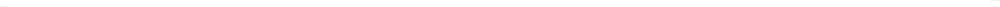

In [ ]:
model_type_eff = models.ross.efficientdet 
backbone_eff = model_type_eff.backbones.tf_lite0
model_eff = model_type_eff.model(
            backbone = backbone_eff(pretrained=True), 
            num_classes=len(parser.class_map), img_size = size)
train_dl_eff = model_type_eff.train_dl(
            train_ds, batch_size=16, num_workers=4, shuffle=True)
valid_dl_eff = model_type_eff.valid_dl(
            valid_ds, batch_size=16, num_workers=4, shuffle=False)
 
learn_eff = model_type_eff.fastai.learner(
            dls=[train_dl_eff, valid_dl_eff], 
            model=model_eff, metrics=metrics)
learn_eff.lr_find()    # output: lr_min 0.010000000149011612
learn_eff.fine_tune(10, 1e-2, freeze_epochs=1) 
plot_metrics(learn_eff, 
            'Mean Average Precision and Losses for EfficientDet')

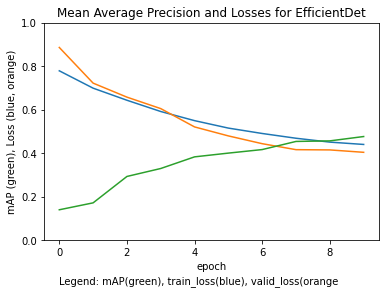

In [ ]:
plot_metrics(learn_eff, 
            'Mean Average Precision and Losses for EfficientDet')

# **Best Model YOLO V5**

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


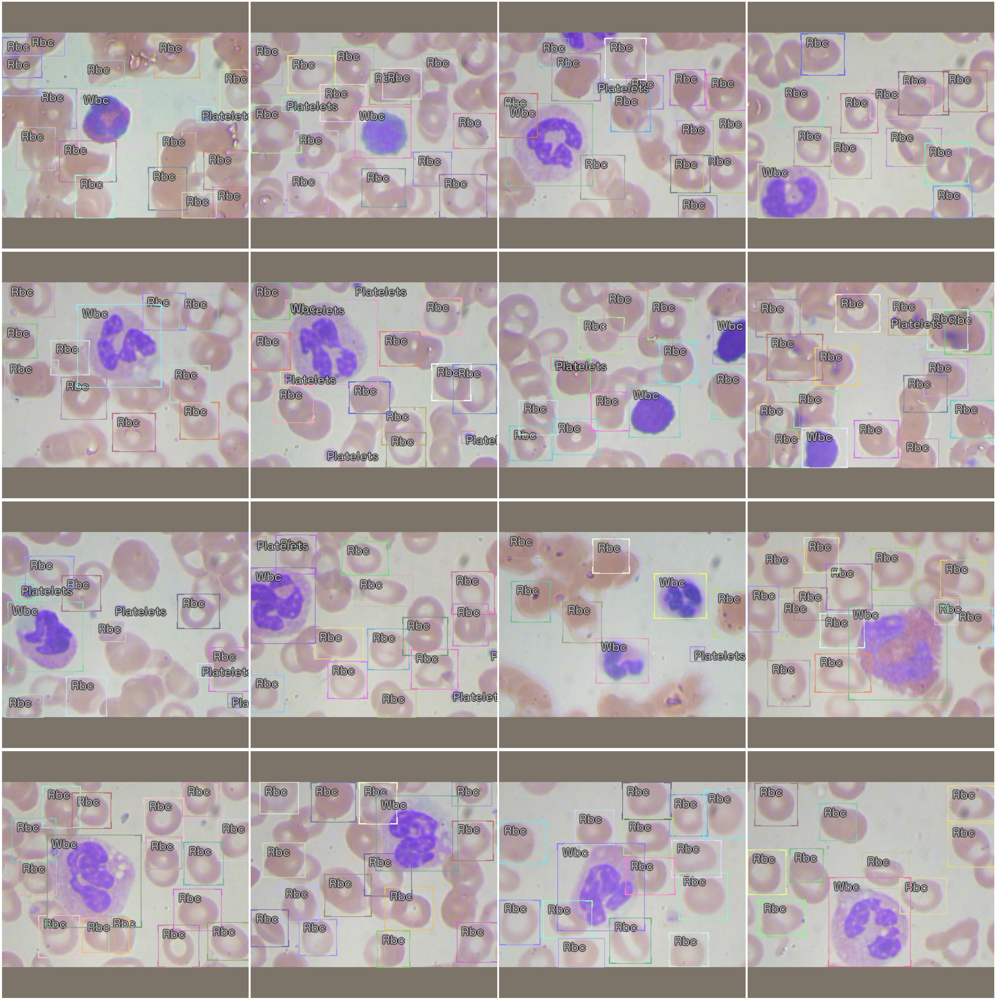

In [ ]:
model_type = models.ultralytics.yolov5 
backbone = model_type.backbones.small 
model = model_type.model(
                backbone = backbone(pretrained=True), 
                num_classes=len(parser.class_map), img_size = size)
train_dl = model_type.train_dl(
             train_ds, batch_size=16, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(
             valid_ds, batch_size=16, num_workers=4, shuffle=False)
                                       
learn = model_type.fastai.learner(
             dls=[train_dl, valid_dl], model=model, metrics=metrics)
model_type.show_batch(first(valid_dl), ncols=4)

In [ ]:
learn = model_type.fastai.learner(
          dls=[train_dl, valid_dl], model=model, metrics=metrics)
# learn.lr_find()
from fastai.callback.tracker import SaveModelCallback
fname='bccd-faster-rcnn-best'
learn.fine_tune(50, 1e-02, freeze_epochs=1,   cbs=SaveModelCallback(monitor='COCOMetric', fname=fname))

epoch,train_loss,valid_loss,COCOMetric,time
0,1.292233,1.114250,0.022542,00:14


Better model found at epoch 0 with COCOMetric value: 0.022542481251160203.


epoch,train_loss,valid_loss,COCOMetric,time
0,0.933274,1.018860,0.117128,00:15
1,0.838478,0.903486,0.230507,00:15
2,0.771270,0.816198,0.378527,00:15
3,0.720825,0.726482,0.444638,00:14
4,0.688308,0.775570,0.424537,00:14
5,0.657875,0.730578,0.468011,00:14
6,0.633567,0.626687,0.443608,00:15
7,0.618313,0.681567,0.408871,00:14
8,0.604839,0.612262,0.518253,00:14
9,0.596900,0.734834,0.372731,00:14


Better model found at epoch 0 with COCOMetric value: 0.11712814851744503.
Better model found at epoch 1 with COCOMetric value: 0.23050699305620143.
Better model found at epoch 2 with COCOMetric value: 0.3785265946222327.
Better model found at epoch 3 with COCOMetric value: 0.4446381264126172.
Better model found at epoch 5 with COCOMetric value: 0.46801126206937094.
Better model found at epoch 8 with COCOMetric value: 0.5182532786877971.
Better model found at epoch 12 with COCOMetric value: 0.5223814597991697.
Better model found at epoch 13 with COCOMetric value: 0.5452902918600457.
Better model found at epoch 17 with COCOMetric value: 0.5495939167804712.
Better model found at epoch 22 with COCOMetric value: 0.5847185619932614.
Better model found at epoch 24 with COCOMetric value: 0.5997363300132839.
Better model found at epoch 32 with COCOMetric value: 0.6171018943293074.
Better model found at epoch 38 with COCOMetric value: 0.6210552059955694.
Better model found at epoch 41 with COCOM

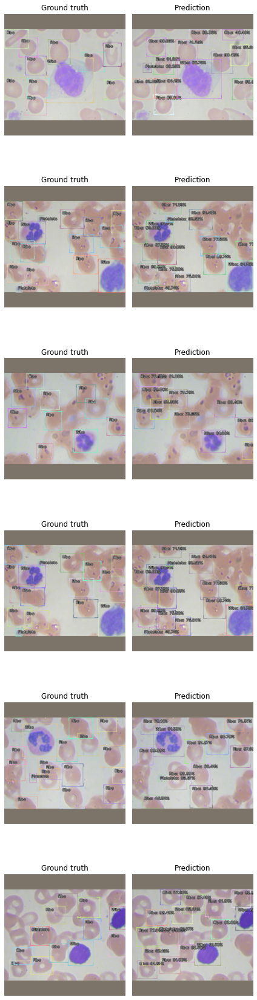

In [ ]:
model_type.show_results(model, valid_ds)

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
root_dir = Path('/content/drive/MyDrive/')
!ls models   # output: bccd-faster-rcnn-best.pth
!cp models/bccd-faster-rcnn-best.pth /content/drive/MyDrive/temp_models/bccd-faster-rcnn-best.pth

Mounted at /content/drive
bccd-faster-rcnn-best.pth
